<a href="https://colab.research.google.com/github/BrainstormerAI/Use-Cases-of-Stable-Diffusion/blob/main/Upscale%20Image/Upscale_Image_using_stable_diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Wed May 31 13:48:35 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install diffusers==0.10.0
!pip install transformers scipy ftfy accelerate
!pip install "ipywidgets>=7,<8"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.9/502.9 kB 39.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 34.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 113.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 123.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 74.8 MB/s eta 0:00:00


In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
import glob
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = "max_split_size_mb:100"
import torch
import numpy as np
import gc
from diffusers import StableDiffusionPipeline


In [ ]:
# make sure you're logged in with `huggingface-cli login`
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16)
pipe = pipe.to("cuda")
# img2imgpipe = StableDiffusionImg2ImgPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",revision="fp16", torch_dtype=torch.float16,use_auth_token=True)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [ ]:
!git clone https://github.com/TencentARC/GFPGAN.git
os.chdir("GFPGAN")


!pip install basicsr

!pip install facexlib
!pip install -r requirements.txt
!python setup.py develop
os.chdir("..")

#realesr
!git clone https://github.com/xinntao/Real-ESRGAN.git
# !pip install realesrgan
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P /content/Real-ESRGAN/experiments/pretrained_models
os.chdir("Real-ESRGAN")
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop
!python setup.py install
os.chdir("..")


!wget https://github.com/TencentARC/GFPGAN/releases/download/v1.3.0/GFPGANv1.3.pth -P /content/GFPGAN/experiments/pretrained_models
!git clone https://github.com/JingyunLiang/SwinIR.git
!pip install timm
!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth -P experiments/pretrained_models
!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth -P experiments/pretrained_models



Cloning into 'GFPGAN'...
remote: Enumerating objects: 523, done.
remote: Total 523 (delta 0), reused 0 (delta 0), pack-reused 523
Receiving objects: 100% (523/523), 5.39 MiB | 11.43 MiB/s, done.
Resolving deltas: 100% (264/264), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 17.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 111.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.9/200.9 kB 28.2 MB/s eta 0:00:00
  Created wheel for basicsr: filename=basicsr-1.4.2-py3-none-any.whl size=214823 sha256=27b2676b92c540aef99a60d0fd405632119475a33af9c773cd664c5ae17c20c7
  Stored in directory: /root/.cache/pip/wheels/38/83/99/2d8437cc652a01af27df5ff037a4075e95b52d67705c5f30ca
Successfully built basicsr


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110459 sha256=866fc48ded8292184f692f65e9a43db5c1e0d6d70a82486c6d0e4cefd54b388b
  Stored in directory: /root/.cache/pip/wheels/0f/0c/ea/218f266af4ad626897562199fbbcba521b8497303200186102
Successfully built filterpy
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
/usr/local/lib/python3.10/dist-packages/setuptools/__init__.py:84: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
!!

        ********************************************************************************
        Requirements should be satisfied by a PEP 517 installer.
     

In [ ]:
os.chdir("Real-ESRGAN")
from realesrgan import RealESRGANer
from basicsr.archs.rrdbnet_arch import RRDBNet
esrdevice='cuda'
with torch.no_grad():
  RealESRUpScale = RealESRGANer(model_path="./experiments/pretrained_models/RealESRGAN_x4plus.pth",scale=4,device=esrdevice,model= RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4))
os.chdir("..")

In [ ]:

from google.colab import files
import shutil

upload_folder = 'upload'
result_folder = 'results'
final_folder = 'final'
forswin_folder = 'forswin'

if os.path.isdir(upload_folder):
    shutil.rmtree(upload_folder)
if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)
if os.path.isdir(final_folder):
    shutil.rmtree(final_folder)
if os.path.isdir(forswin_folder):
    shutil.rmtree(forswin_folder)
os.mkdir(upload_folder)
os.mkdir(result_folder)
os.mkdir(final_folder)
os.mkdir(forswin_folder)

In [ ]:
from PIL import Image


def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

def display_com(img_paths,gen_paths,output_name="Result"):
  fig,axs = plt.subplots(len(img_paths),2,figsize=(20,30))
  axs[0,0].set_title("Input", fontsize=16)
  axs[0,1].set_title(output_name, fontsize=16)
  for i,j,k in zip(range(len(img_paths)),img_paths,gen_paths):
    axs[i,0].imshow(imread(j))
    axs[i,1].imshow(imread(k))
    axs[i,0].axis("off")
    axs[i,1].axis("off")
  plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)
  plt.show()


def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
y_prompt = ["Generate a realistic image of Shah Rukh Khan, the Bollywood actor, wearing a black suit and smiling,((hd)),1024 high quality"]

9808


  0%|          | 0/50 [00:00<?, ?it/s]

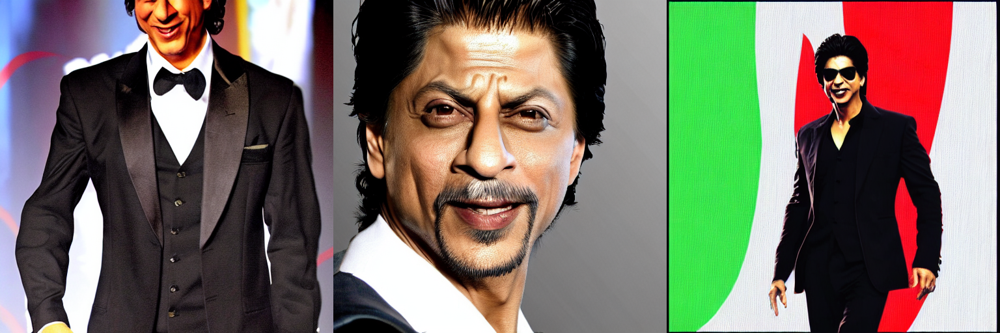

In [ ]:
import random
from torch import autocast

dir = './upload'
if os.path.isdir(dir):
  for f in os.listdir(dir):
    try:
      os.remove(os.path.join(dir, f))
    except:
      pass

torch.cuda.empty_cache()
gc.collect()
num_images = 3
prompt = y_prompt * num_images
rn = random.randint(0,10000000)

# rn=1624589

print(rn)
with torch.no_grad():
  generator = torch.Generator("cuda").manual_seed(rn)
  with autocast("cuda"):
    images = pipe(prompt,generator=generator, num_inference_steps=50).images
    for i,j in enumerate(images):
      j.save("./upload/img{}-{}".format(i,rn)+'.png')
images_2up = './upload'
torch.cuda.empty_cache()
grid = image_grid(images, rows=1, cols=3)
grid

##Refine Same Images(Generated in Prev step) with 100 steps. You Can Directly jump to the next Cell (Optional: if results are weird)

  0%|          | 0/100 [00:00<?, ?it/s]

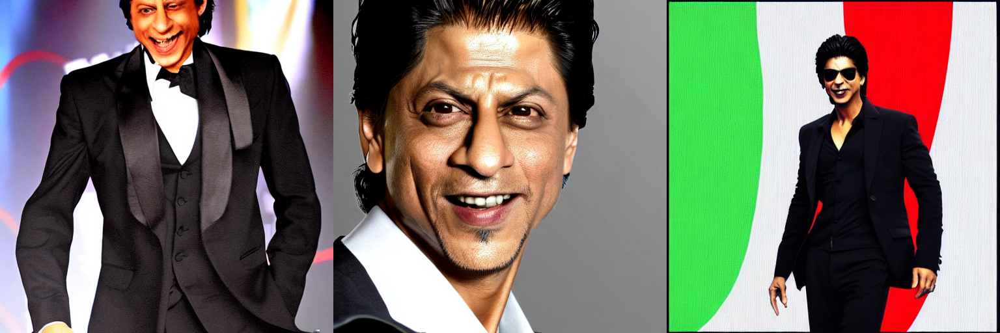

In [ ]:
torch.cuda.empty_cache()
gc.collect()
generator = torch.Generator("cuda").manual_seed(rn)

dir = './upload'
if os.path.isdir(dir):
  for f in os.listdir(dir):
    try:
      os.remove(os.path.join(dir, f))
    except:
      pass

with autocast("cuda"):
  images = pipe(prompt,generator=generator, num_inference_steps=100).images
  for i,j in enumerate(images):
    j.save("./upload/img{}-{}".format(i,rn)+'.png')
images_2up = './upload'
torch.cuda.empty_cache()
grid = image_grid(images, rows=1, cols=3)
grid

##Run This Cell Only if Face is not Restored Completely. (Optional: if faces are destorted)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Processing img0-9808.png ...
	Tile 1/4
	Tile 2/4
	Tile 3/4
	Tile 4/4
Processing img1-9808.png ...
	Tile 1/4
	Tile 2/4
	Tile 3/

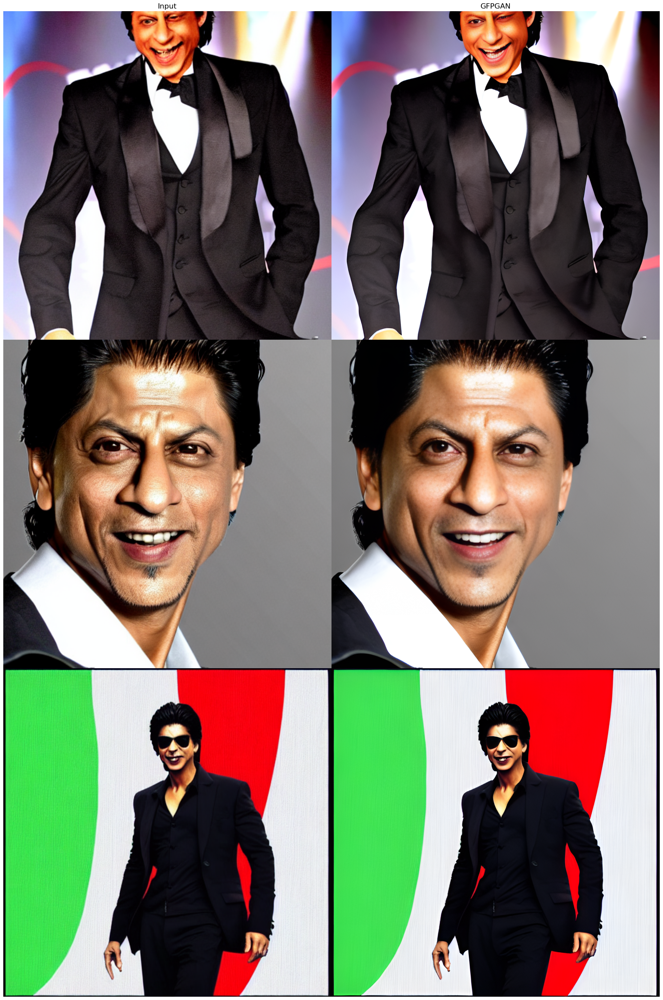

In [ ]:
torch.cuda.empty_cache()
gc.collect()
# os.chdir("/content/GFPGAN")
dir = './results/restored_imgs'
if os.path.isdir(dir):
  for f in os.listdir(dir):
    try:
      os.remove(os.path.join(dir, f))
    except:
      pass

!python GFPGAN/inference_gfpgan.py -i /content/upload -o /content/results -s 2
# os.chdir("/content")

torch.cuda.empty_cache()
gc.collect()
# display each image in the upload folder

images_2up = './results/restored_imgs'

input_folder = './upload'
result_folder = './results/restored_imgs'
input_list = sorted(glob.glob(os.path.join(input_folder, '*.png')))
output_list = sorted(glob.glob(os.path.join(result_folder, '*.png')))
print(len(input_list))
print(len(output_list))
display_com(input_list,output_list,output_name="GFPGAN")

# **Real-ESRGAN Upscale**

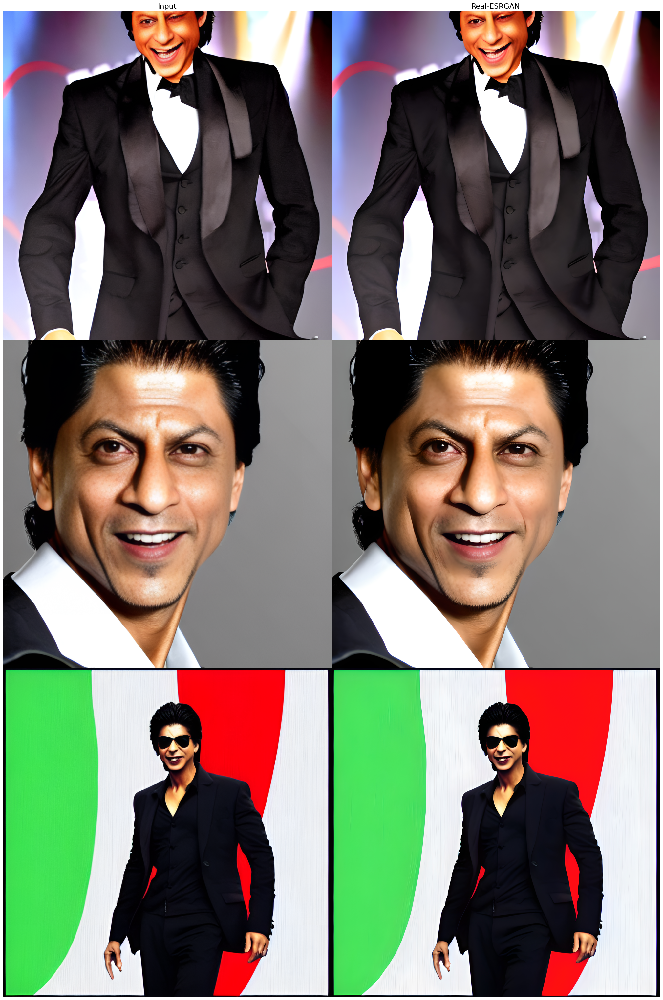

In [ ]:
torch.cuda.empty_cache()
gc.collect()

dir = './final'
if os.path.isdir(dir):
  for f in os.listdir(dir):
    try:
      os.remove(os.path.join(dir, f))
    except:
      pass

# images_2up = "results/restored_imgs"
imgs_path = sorted(glob.glob(os.path.join(images_2up, '*.png')))
imgs = []
for path in imgs_path:
  imgs.append(Image.open(path).convert('RGB'))


for i,j in enumerate(imgs):
  with torch.no_grad():
    output, _ = RealESRUpScale.enhance(np.array(j), outscale=8)
  output = Image.fromarray(output)
  output.save("final/fin_img_upscaled_{}_{}.jpg".format(rn,i),quality=98)
torch.cuda.empty_cache()
gc.collect()

input_folder = images_2up
result_folder = './final'
input_list = sorted(glob.glob(os.path.join(input_folder, '*.*')))
output_list = sorted(glob.glob(os.path.join(result_folder, '*.*')))
display_com(input_list,output_list,output_name="Real-ESRGAN")